# Brazilian E-Commerce Public Dataset by Olist 💰📢

### <u>Problem Statement</u>
E-commerce provides an easy way to sell products to a large customer base. To tailor marketing campaigns for the customers, e-commerce retailers need to know their customers well. One of the methods to know the customers is to perform customer segmentation. Customer segmentation could help the e-commerce retailers to know its customer base and find out which segment of customers it might be missing. Besides, customer segmentation could also help the e-commerce retailers to find out that the products that its customers are buying together. This may prompt the e-commerce retailers to bundle those product together as a combined offering, which may increase revenue for the retailer and make the buying process more streamlined for the customers.


### <u>Objectives</u>
* To determine customer satisfaction by creating wordclouds for the top & botttom 10 product categories (based on review scores). 
* To determine a customer’s value by using the RFM model. It involves taking account of the recency, frequency, and the monetary value of the customers. 
* To divide customer bases into different segments based on various customer attributes.


### <u>Dataset</u>
🌟 Provided by Olist on <a href="https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce?datasetId=55151&sortBy=voteCount&searchQuery=rfm">Kaggle</a>. The dataset has information of orders from 2016 to 2018 made at multiple marketplaces in Brazil. 
<img src='https://i.imgur.com/HRhd2Y0.png' width='800'>

In [1]:
import warnings
warnings.filterwarnings('ignore')

# Import needed libraries
import numpy as np
import pandas as pd
import datetime
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
import seaborn as sns
sns.set_style('darkgrid')
import plotly.express as px
import plotly.offline as py
py.offline.init_notebook_mode()
import plotly.graph_objs as go
from IPython.display import display, HTML

# for NLP reviews of the top/ bottom 10 product categories 
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
import re, nltk
from nltk import word_tokenize
from nltk.corpus import stopwords
from wordcloud import WordCloud, STOPWORDS
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# for clustering
import math
from scipy.stats import norm
from sklearn import preprocessing
from sklearn.cluster import MiniBatchKMeans
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn import metrics
from scipy.spatial.distance import cdist

In [2]:
# load dataset
customer_df = pd.read_csv("https://raw.githubusercontent.com/jadanpl/Brazilian-E-Commerce-Olist/main/Datasets/olist_customers_dataset.csv")
order_item_df = pd.read_csv("https://raw.githubusercontent.com/jadanpl/Brazilian-E-Commerce-Olist/main/Datasets/olist_order_items_dataset.csv")
order_pyt_df = pd.read_csv("https://raw.githubusercontent.com/jadanpl/Brazilian-E-Commerce-Olist/main/Datasets/olist_order_payments_dataset.csv")
order_review_df = pd.read_csv("https://raw.githubusercontent.com/jadanpl/Brazilian-E-Commerce-Olist/main/Datasets/olist_order_reviews_dataset.csv")
order_df = pd.read_csv("https://raw.githubusercontent.com/jadanpl/Brazilian-E-Commerce-Olist/main/Datasets/olist_orders_dataset.csv")
product_df = pd.read_csv("https://raw.githubusercontent.com/jadanpl/Brazilian-E-Commerce-Olist/main/Datasets/olist_products_dataset.csv")
seller_df = pd.read_csv("https://raw.githubusercontent.com/jadanpl/Brazilian-E-Commerce-Olist/main/Datasets/olist_sellers_dataset.csv")
product_cat_df = pd.read_csv("https://raw.githubusercontent.com/jadanpl/Brazilian-E-Commerce-Olist/main/Datasets/product_category_name_translation.csv")

## Data Cleaning & Preprocessing

In [3]:
# remove rows where the order_status is NOT equal to 'delivered' 
status = ['canceled','shipped','unavailable','invoiced','processing','created','approved']
order_df = order_df[~order_df['order_status'].isin(status)]

In [4]:
order_df.isnull().sum()

order_id                          0
customer_id                       0
order_status                      0
order_purchase_timestamp          0
order_approved_at                14
order_delivered_carrier_date      2
order_delivered_customer_date     8
order_estimated_delivery_date     0
dtype: int64

In [5]:
# remove rows with null values
order_df = order_df[~order_df['order_approved_at'].isnull()]
order_df = order_df[~order_df['order_delivered_customer_date'].isnull()]
order_df = order_df[~order_df['order_delivered_carrier_date'].isnull()]

columns_timestamp = ['order_purchase_timestamp','order_approved_at', 'order_delivered_carrier_date', 
                     'order_delivered_customer_date', 'order_estimated_delivery_date']

for column in columns_timestamp:
    order_df[column] = pd.to_datetime(order_df[column])   

I uploaded the olist_order_reviews_dataset to my Google drive and opened the file with Google Spreadsheet. Then, I used functions to remove line breaks and translate the review comments from Portugese into English `=SUBSTITUTE(GOOGLETRANSLATE(text,"pt","en"),CHAR(10),"")`. After that, I saved the file with translated comments in the format of csv.  This `order_review_df` dataframe would be combined with other cleaned dataframes in order to preserve most of the data. On the other hands, the `translated_review_df` dataframe (all of its null comments removed) would be used when we need to perform sentimetal analysis on the reviews and create wordclouds. 

In [6]:
# load review dataset that contains the english translation
translated_review_df = pd.read_csv("https://raw.githubusercontent.com/jadanpl/Brazilian-E-Commerce-Olist/main/Datasets/cleaned_translated_reviews.csv")

In [7]:
translated_review_df = translated_review_df[~translated_review_df['review_comment_en'].isin(['#VALUE!'])]
translated_review_df = translated_review_df.drop(['review_comment_message','review_creation_date','review_answer_timestamp','review_comment_title'], axis=1)

# save cleaned dataframe to csv
# translated_review_df.to_csv('cleaned_translated_reviews.csv',index=False)

In [8]:
product_df = product_df.merge(product_cat_df, on='product_category_name',how='inner')
product_df.replace({'home_appliances_2': 'home_appliances','home_confort':'home_comfort','home_comfort_2':'home_comfort'}, 
                   inplace=True)
product_df = product_df.drop(['product_category_name'],axis=1)

# remove unnecessary columns
product_df = product_df.drop(['product_name_lenght', 'product_description_lenght', 'product_photos_qty'], axis=1)

# calculate the product volume
product_df['product_volume_cubic_cm'] = product_df['product_length_cm']*product_df['product_height_cm']*product_df['product_width_cm']

# rename columns
product_df.rename(columns={'product_category_name_english':'product_category'},inplace=True)

# # impute missing values 
product_df['product_weight_g'] = product_df['product_weight_g'].fillna(product_df['product_weight_g'].median())
product_df['product_length_cm'] = product_df['product_length_cm'].fillna(product_df['product_length_cm'].median())
product_df['product_height_cm'] = product_df['product_height_cm'].fillna(product_df['product_height_cm'].median())
product_df['product_width_cm'] = product_df['product_width_cm'].fillna(product_df['product_width_cm'].median())
product_df['product_volume_cubic_cm'] = product_df['product_volume_cubic_cm'].fillna(product_df['product_volume_cubic_cm'].median())

In [9]:
comp_df = order_df.copy()
comp_df = comp_df.merge(customer_df, on='customer_id',how='inner')
comp_df = comp_df.merge(order_item_df, on='order_id', how='inner')
comp_df = comp_df.merge(order_pyt_df, on='order_id', how='inner')
comp_df = comp_df.merge(order_review_df, on='order_id', how='inner')
comp_df = comp_df.merge(product_df, on='product_id', how='inner')
comp_df = comp_df.merge(seller_df, on='seller_id',how='inner')

# remove unnecessary columns
comp_df = comp_df.drop(['product_id', 'customer_zip_code_prefix', 'seller_zip_code_prefix','review_comment_message','review_comment_title'], axis=1)

In [10]:
print('Number of duplicated review_id: ', len(comp_df[comp_df.duplicated(subset=['review_id'])==True]))
print('Number of duplicated order_id: ', len(comp_df[comp_df.duplicated(subset='order_id')==True]))

Number of duplicated review_id:  18897
Number of duplicated order_id:  18721


In [11]:
review_order = comp_df.groupby('review_id').agg({'order_id':'nunique'}).sort_values('order_id',ascending=False).reset_index()
review_more_order = review_order[review_order['order_id']>1]
print(len(review_more_order['review_id']),"reviews are associated with more than 1 order.")

681 reviews are associated with more than 1 order.


In [12]:
order_review = comp_df.groupby('order_id').agg({'review_id':'nunique'}).sort_values('review_id',ascending=False).reset_index()
order_more_review = order_review[order_review['review_id']>1]
print(len(order_more_review['order_id']),"orders are associated with more than 1 review.")

517 orders are associated with more than 1 review.


In [13]:
comp_df = comp_df[~comp_df['review_id'].isin(review_more_order['review_id'].to_list())]
comp_df = comp_df[~comp_df['order_id'].isin(order_more_review['order_id'].to_list())]

For simplicity, those reviews asssociated with more than one order and those orders associated with more than one review are removed. There are still duplicated `review_id` and `order_id` in the dataset, but now each `review_id` is associated with one `order_id` and one `review_comment_en`. These `review_id` and `order_id` are duplicated because they are related to different `order_item_id`, `seller_id` and `product_category`. 

In [14]:
with pd.option_context('display.max_columns', None):
    display(comp_df[comp_df['review_id']=='603ddc65c5b8913a5916447af9bf358a'])

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_city,customer_state,order_item_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_creation_date,review_answer_timestamp,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category,product_volume_cubic_cm,seller_city,seller_state
20023,7f2c22c54cbae55091a09a9653fd2b8a,f4c13379ddd0ed4f4fc1c0b49c2c5e51,delivered,2018-03-10 10:53:51,2018-03-11 10:55:56,2018-03-14 17:55:24,2018-03-21 17:46:34,2018-04-04,fe2b2f70f3dc31c23319ae1029eac77f,alto paraiso de goias,GO,1,1025f0e2d44d7041d6cf58b6550e0bfa,2018-03-15 10:55:56,84.0,29.44,1,credit_card,2,1048.31,603ddc65c5b8913a5916447af9bf358a,3,2018-03-22 00:00:00,2018-03-23 00:22:21,4100.0,30.0,35.0,30.0,furniture_decor,31500.0,sao paulo,SP
20024,7f2c22c54cbae55091a09a9653fd2b8a,f4c13379ddd0ed4f4fc1c0b49c2c5e51,delivered,2018-03-10 10:53:51,2018-03-11 10:55:56,2018-03-14 17:55:24,2018-03-21 17:46:34,2018-04-04,fe2b2f70f3dc31c23319ae1029eac77f,alto paraiso de goias,GO,3,1025f0e2d44d7041d6cf58b6550e0bfa,2018-03-15 10:55:56,84.0,29.44,1,credit_card,2,1048.31,603ddc65c5b8913a5916447af9bf358a,3,2018-03-22 00:00:00,2018-03-23 00:22:21,4100.0,30.0,35.0,30.0,furniture_decor,31500.0,sao paulo,SP
20025,7f2c22c54cbae55091a09a9653fd2b8a,f4c13379ddd0ed4f4fc1c0b49c2c5e51,delivered,2018-03-10 10:53:51,2018-03-11 10:55:56,2018-03-14 17:55:24,2018-03-21 17:46:34,2018-04-04,fe2b2f70f3dc31c23319ae1029eac77f,alto paraiso de goias,GO,4,1025f0e2d44d7041d6cf58b6550e0bfa,2018-03-15 10:55:56,84.0,29.44,1,credit_card,2,1048.31,603ddc65c5b8913a5916447af9bf358a,3,2018-03-22 00:00:00,2018-03-23 00:22:21,4100.0,30.0,35.0,30.0,furniture_decor,31500.0,sao paulo,SP
20026,7f2c22c54cbae55091a09a9653fd2b8a,f4c13379ddd0ed4f4fc1c0b49c2c5e51,delivered,2018-03-10 10:53:51,2018-03-11 10:55:56,2018-03-14 17:55:24,2018-03-21 17:46:34,2018-04-04,fe2b2f70f3dc31c23319ae1029eac77f,alto paraiso de goias,GO,6,1025f0e2d44d7041d6cf58b6550e0bfa,2018-03-15 10:55:56,84.0,29.44,1,credit_card,2,1048.31,603ddc65c5b8913a5916447af9bf358a,3,2018-03-22 00:00:00,2018-03-23 00:22:21,4100.0,30.0,35.0,30.0,furniture_decor,31500.0,sao paulo,SP
20027,7f2c22c54cbae55091a09a9653fd2b8a,f4c13379ddd0ed4f4fc1c0b49c2c5e51,delivered,2018-03-10 10:53:51,2018-03-11 10:55:56,2018-03-14 17:55:24,2018-03-21 17:46:34,2018-04-04,fe2b2f70f3dc31c23319ae1029eac77f,alto paraiso de goias,GO,10,1025f0e2d44d7041d6cf58b6550e0bfa,2018-03-15 10:55:56,84.0,29.44,1,credit_card,2,1048.31,603ddc65c5b8913a5916447af9bf358a,3,2018-03-22 00:00:00,2018-03-23 00:22:21,4100.0,30.0,35.0,30.0,furniture_decor,31500.0,sao paulo,SP
20028,7f2c22c54cbae55091a09a9653fd2b8a,f4c13379ddd0ed4f4fc1c0b49c2c5e51,delivered,2018-03-10 10:53:51,2018-03-11 10:55:56,2018-03-14 17:55:24,2018-03-21 17:46:34,2018-04-04,fe2b2f70f3dc31c23319ae1029eac77f,alto paraiso de goias,GO,11,1025f0e2d44d7041d6cf58b6550e0bfa,2018-03-15 10:55:56,84.0,29.44,1,credit_card,2,1048.31,603ddc65c5b8913a5916447af9bf358a,3,2018-03-22 00:00:00,2018-03-23 00:22:21,4100.0,30.0,35.0,30.0,furniture_decor,31500.0,sao paulo,SP
37178,7f2c22c54cbae55091a09a9653fd2b8a,f4c13379ddd0ed4f4fc1c0b49c2c5e51,delivered,2018-03-10 10:53:51,2018-03-11 10:55:56,2018-03-14 17:55:24,2018-03-21 17:46:34,2018-04-04,fe2b2f70f3dc31c23319ae1029eac77f,alto paraiso de goias,GO,2,1f50f920176fa81dab994f9023523100,2018-03-15 10:55:56,53.9,19.63,1,credit_card,2,1048.31,603ddc65c5b8913a5916447af9bf358a,3,2018-03-22 00:00:00,2018-03-23 00:22:21,1500.0,30.0,22.0,30.0,garden_tools,19800.0,sao jose do rio preto,SP
37179,7f2c22c54cbae55091a09a9653fd2b8a,f4c13379ddd0ed4f4fc1c0b49c2c5e51,delivered,2018-03-10 10:53:51,2018-03-11 10:55:56,2018-03-14 17:55:24,2018-03-21 17:46:34,2018-04-04,fe2b2f70f3dc31c23319ae1029eac77f,alto paraiso de goias,GO,5,1f50f920176fa81dab994

In [15]:
comp_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 110885 entries, 0 to 113186
Data columns (total 32 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   order_id                       110885 non-null  object        
 1   customer_id                    110885 non-null  object        
 2   order_status                   110885 non-null  object        
 3   order_purchase_timestamp       110885 non-null  datetime64[ns]
 4   order_approved_at              110885 non-null  datetime64[ns]
 5   order_delivered_carrier_date   110885 non-null  datetime64[ns]
 6   order_delivered_customer_date  110885 non-null  datetime64[ns]
 7   order_estimated_delivery_date  110885 non-null  datetime64[ns]
 8   customer_unique_id             110885 non-null  object        
 9   customer_city                  110885 non-null  object        
 10  customer_state                 110885 non-null  object        
 11  

In [16]:
with pd.option_context('display.max_columns', None):
    display(comp_df.describe(include=[int, float,object]))

,order_id,customer_id,order_status,customer_unique_id,customer_city,customer_state,order_item_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_creation_date,review_answer_timestamp,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category,product_volume_cubic_cm,seller_city,seller_state
count,110885,110885,110885,110885,110885,110885,110885.000000,110885,110885,110885.000000,110885.000000,110885.000000,110885,110885.000000,110885.000000,110885,110885.000000,110885,110885,110885.000000,110885.000000,110885.000000,110885.000000,110885,110885.000000,110885,110885
unique,93164,93164,1,90825,4063,27,NaN,2899,88336,NaN,NaN,NaN,4,NaN,NaN,93164,NaN,626,93020,NaN,NaN,NaN,NaN,69,NaN,585,22
top,895ab968e7bb0d5659d16cd74cd1650c,270c23a11d024a44c896d1894b261a83,delivered,9a736b248f67d166d2fbb006bcb877c3,sao paulo,SP,NaN,6560211a19b47992c3666cc44a7e94c0,2017-08-14 20:43:31,NaN,NaN,NaN,credit_card,NaN,NaN,eef5dbca8d37dfce6db7d7b16dd0525e,NaN,2018-05-22 00:00:00,2017-08-17 22:17:55,NaN,NaN,NaN,NaN,bed_bath_table,NaN,sao paulo,SP
freq,63,63,110885,75,17456,46838,NaN,2045,63,NaN,NaN,NaN,81848,NaN,NaN,63,NaN,518,63,NaN,NaN,NaN,NaN,11170,NaN,27743,79005
mean,NaN,NaN,NaN,NaN,NaN,NaN,1.193660,NaN,NaN,120.470339,20.038706,1.089733,NaN,2.930414,172.023355,NaN,4.087514,NaN,NaN,2111.901601,30.250719,16.631402,23.070911,NaN,15328.744501,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,0.684353,NaN,NaN,182.428107,15.770771,0.683350,NaN,2.769048,265.868622,NaN,1.341794,NaN,NaN,3769.444423,16.160135,13.456136,11.730212,NaN,23448.289904,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,0.850000,0.000000,1.000000,NaN,0.000000,0.000000,NaN,1.000000,NaN,NaN,0.000000,7.000000,2.000000,6.000000,NaN,168.000000,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,39.900000,13.080000,1.000000,NaN,1.000000,61.000000,NaN,4.000000,NaN,NaN,300.000000,18.000000,8.000000,15.000000,NaN,2856.000000,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,74.900000,16.320000,1.000000,NaN,2.000000,108.200000,NaN,5.000000,NaN,NaN,700.000000,25.000000,13.000000,20.000000,NaN,6650.000000,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,134.900000,21.220000,1.000000,NaN,4.000000,189.350000,NaN,5.000000,NaN,NaN,1800.000000,38.000000,20.000000,30.000000,NaN,18576.000000,NaN,NaN


## Explanatory Data Analysis

In [17]:
print('Earlist Purchase Date: ', comp_df['order_purchase_timestamp'].min())
print('Latest Purchase Date: ', comp_df['order_purchase_timestamp'].max())

Earlist Purchase Date:  2016-10-03 09:44:50
Latest Purchase Date:  2018-08-29 15:00:37


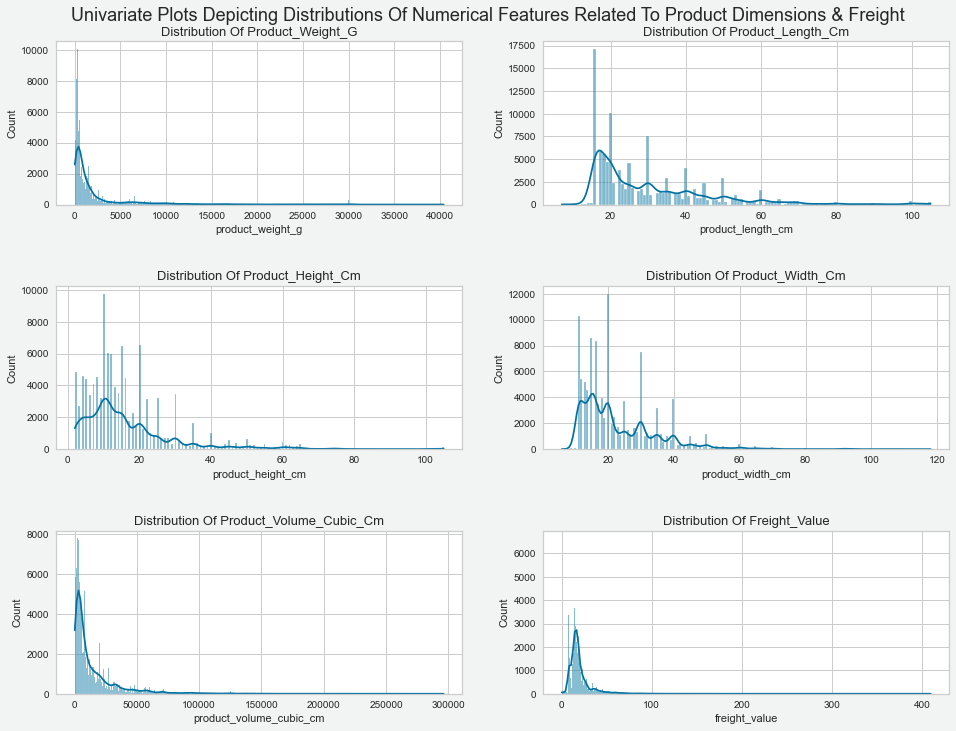

In [18]:
product_dimension_cols = ['product_weight_g','product_length_cm','product_height_cm','product_width_cm','product_volume_cubic_cm','freight_value']

fig, ax = plt.subplots(figsize=(16,12), facecolor='#F2F4F4')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.2, hspace=0.5)
count=1
for i in product_dimension_cols:
    plt.subplot(3,2,count)
    h = sns.histplot(x=i, kde=True,data=comp_df)
    h.set_title(('distribution of ' + i).title(), fontsize=13)
    count+=1
    
fig.suptitle(('Univariate plots depicting distributions of numerical features related to product dimensions & freight').title(), 
             x=0.5, y=0.92, fontsize=18);

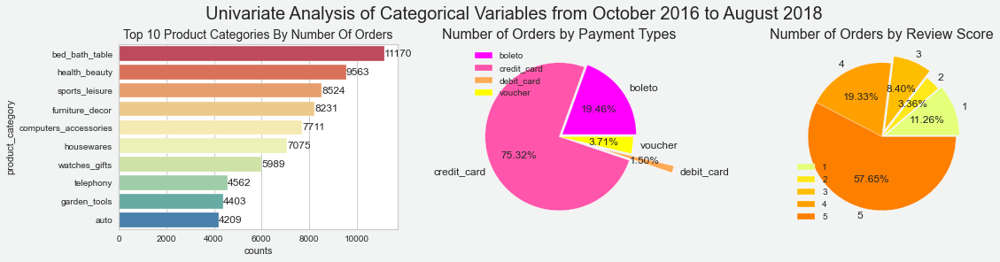

In [19]:
fig, ax = plt.subplots(1,3,figsize=(16,4), facecolor='#F2F4F4',constrained_layout=True)

top10_product_cat = comp_df['product_category'].value_counts().head(10).rename_axis('product_category').reset_index(name='counts')
a = sns.barplot(x=top10_product_cat['counts'],y=top10_product_cat['product_category'],palette='Spectral',ax=ax[0])
a.bar_label(a.containers[0], fontsize=12)
a.set_title(('top 10 product categories by number of orders').title(), fontsize=14)

d = comp_df.groupby('payment_type').agg({'order_id':'nunique'})
d.plot.pie(y='order_id', autopct='%1.2f%%', ylabel='',
           fontsize=12, explode=(0.05,0,0.6,0), cmap='spring',ax=ax[1])
ax[1].set_title('Number of Orders by Payment Types',fontsize=16)

e = comp_df.groupby('review_score').agg({'order_id':'count'})
e.plot.pie(y='order_id', autopct='%1.2f%%', ylabel='',
           fontsize=12, explode=(0.05,0,0.1,0,0), cmap='Wistia',ax=ax[2])
ax[2].set_title('Number of Orders by Review Score',fontsize=16)

plt.suptitle('Univariate Analysis of Categorical Variables from October 2016 to August 2018',fontsize=20);

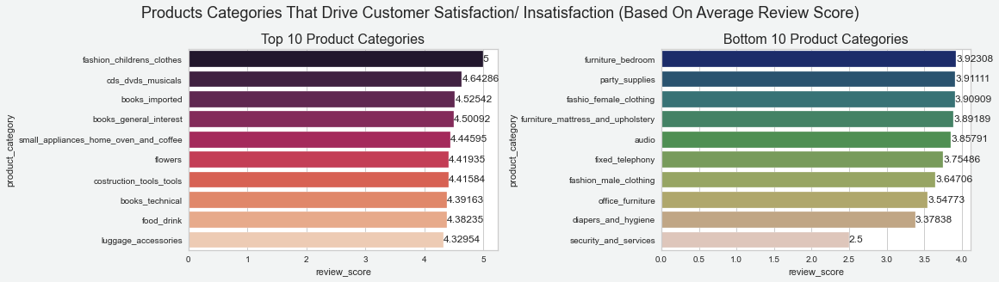

In [20]:
fig, ax = plt.subplots(1,2,figsize=(16,4), facecolor='#F2F4F4',constrained_layout=True)

# top 10 product category based on average review_score
top10_cat = comp_df.groupby('product_category').agg({'review_score':'mean','order_id':'count'}).reset_index().sort_values('review_score', ascending=False).head(10)
g = sns.barplot(y=top10_cat['product_category'], x=top10_cat['review_score'],palette='rocket',ax=ax[0])
g.bar_label(g.containers[0], fontsize=12)
g.set_title(("top 10 product categories").title(), fontsize=16)

# bottom 10 product category based on average review_score
bottom10_cat = comp_df.groupby('product_category').agg({'review_score':'mean','order_id':'count'}).reset_index().sort_values('review_score', ascending=False).tail(10)
f = sns.barplot(y=bottom10_cat['product_category'], x=bottom10_cat['review_score'],palette='gist_earth',ax=ax[1])
f.bar_label(f.containers[0], fontsize=12)
f.set_title(("bottom 10 product categories").title(), fontsize=16)

fig.suptitle(('products categories that drive customer satisfaction/ insatisfaction (based on average review score)').title(), 
             x=0.5, y=1.1, fontsize=18);

We need to <u>transform</u> the reviews data by: 
* Removing stop words, 
* Using the regular expression module to accept only letters, 
* Tokenizing/ separating the text by word or by sentencethe text, and 
* Making all the words lower case for consistency.

In [21]:
review_product_df = order_df.copy()
review_product_df = review_product_df.merge(customer_df, on='customer_id',how='inner')
review_product_df = review_product_df.merge(order_item_df, on='order_id', how='inner')
review_product_df = review_product_df.merge(translated_review_df, on='order_id', how='inner')
review_product_df = review_product_df.merge(product_df, on='product_id', how='inner')

In [22]:
top10_list = top10_cat['product_category'].tolist()
bottom10_list = bottom10_cat['product_category'].tolist()

In [23]:
# filter generic & insignificant stopwords such as articles, pronouns, prepositions, and conjunctions 
stop_words = set(stopwords.words('english'))

# Lemmatizing
wordnet = WordNetLemmatizer()

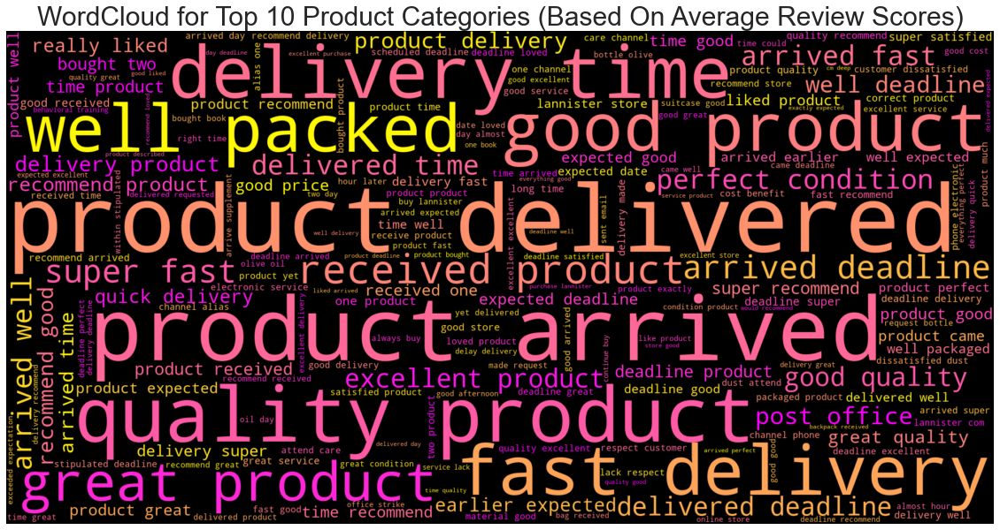

In [24]:
# analyse the reviews for top 10 categories
top10_comments = []
top10_df = review_product_df[review_product_df['product_category'].isin(top10_list)]
for words in top10_df['review_comment_en']:
    letters = re.sub("[^A-Za-z]", " ",words).lower()
    tokens = nltk.word_tokenize(letters) # tokenize the sentences
    lemmatized_words=[wordnet.lemmatize(word) for word in tokens if word not in stop_words]
    top10_comments.append(' '.join(lemmatized_words))

top10_unique = (" ").join(top10_comments) # create string or bytes-like object    
words_top10 = top10_unique.split()

# TFIDF: bigram
bigramslist_top10 = list(nltk.bigrams(words_top10))
bigram_top10 = [' '.join(top) for top in bigramslist_top10]
vectorizer = TfidfVectorizer(use_idf=True, ngram_range=(2,2))
X = vectorizer.fit_transform(bigram_top10)
sum_words = X.sum(axis=0) 
words_freq_top10 = [(word, sum_words[0, idx]) for word, idx in vectorizer.vocabulary_.items()]
words_freq_top10 = sorted(words_freq_top10, key = lambda x: x[1], reverse=True)  
words_dict = dict(words_freq_top10)

# Using wordcloud to visualize the comments
wordcloud_pos = WordCloud(width = 2000, height = 1000, background_color='black', colormap='spring').generate_from_frequencies(words_dict)
plt.figure(figsize=(20,12))
plt.imshow(wordcloud_pos, interpolation='bilinear')
plt.axis("off")
plt.title('WordCloud for Top 10 Product Categories (Based On Average Review Scores)', fontsize=30);

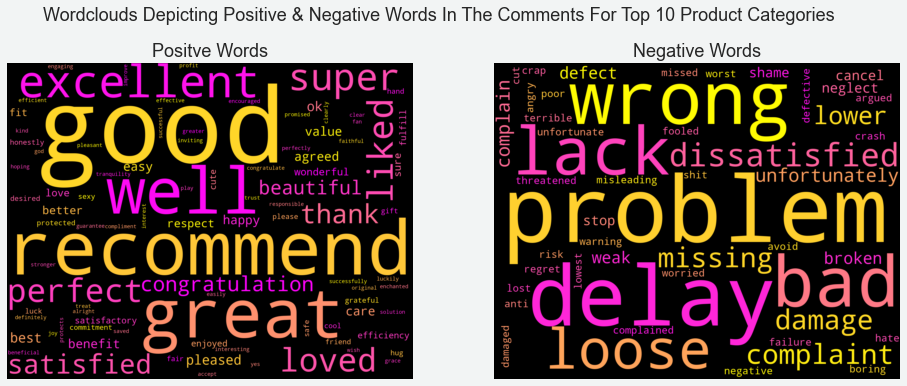

In [25]:
# initialize VADER
sid = SentimentIntensityAnalyzer()
top10_pos_words=[]
top10_neu_words=[]
top10_neg_words=[]
for word in words_top10:
    if (sid.polarity_scores(word)['compound']) >= 0.25:
        top10_pos_words.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.25:
        top10_neg_words.append(word)
    else:
        top10_neu_words.append(word)    

top10_pos = " ".join ([w for w in top10_pos_words])
top10_neg = " ".join ([w for w in top10_neg_words])

top10_comment_df = pd.DataFrame({'Categories': {0: 'Positive', 1: 'Negative'}, 
                                 'Words': {0: top10_pos, 1: top10_neg}})

fig, ax = plt.subplots(figsize=(16,12), facecolor='#F2F4F4')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.2, hspace=0.2)
count=1
for i in range(2):
    wc = WordCloud(background_color='black', width=1800, height=1400,colormap='spring',collocations = False).generate(text=top10_comment_df["Words"][i])   
    plt.subplot(1, 2, count)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    if i==0:
        plt.title("Positve Words", fontsize=18)
    else:
        plt.title("Negative Words", fontsize=18)
    count+=1
    i+=1    
    
fig.suptitle(('wordclouds depicting positive & negative words in the comments for top 10 product categories').title(), 
             x=0.5, y=0.75, fontsize=18);

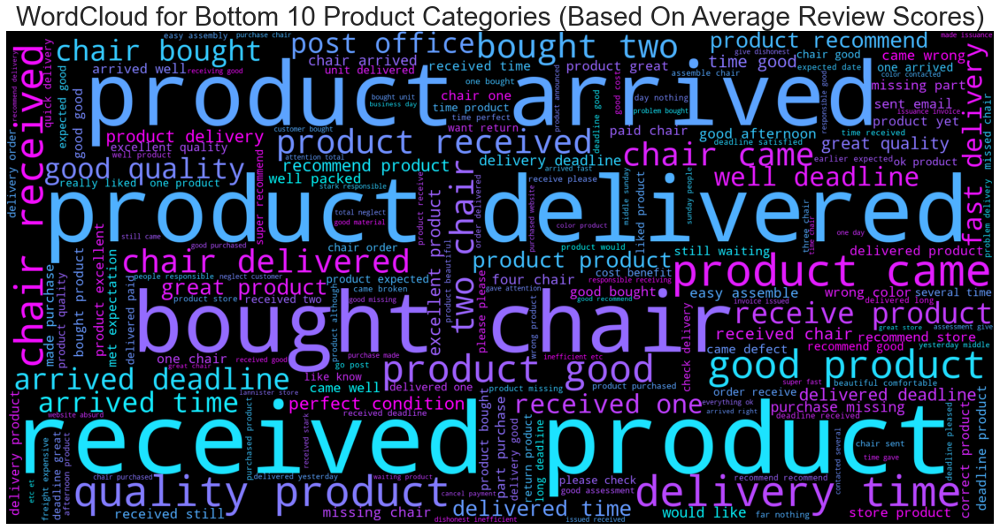

In [26]:
# analyse the reviews for bottom 10 categories
bottom10_comments = []
bottom10_df = review_product_df[review_product_df['product_category'].isin(bottom10_list)]
for words in bottom10_df['review_comment_en']:
    letters = re.sub("[^A-Za-z]", " ",words)
    tokens = nltk.word_tokenize(letters) # tokenize the sentences
    lower_case = [l.lower() for l in tokens] #convert all letters to lower case
    filtered_result = list(filter(lambda l: l not in stop_words,lower_case)) # remove stopwords from the comments
    lemmatized_words=[wordnet.lemmatize(word) for word in filtered_result]
    bottom10_comments.append(' '.join(lemmatized_words))

bottom10_unique=(" ").join(bottom10_comments) # create string or bytes-like object
words_bottom10 = bottom10_unique.split()

# TFIDF: bigram
bigramslist_bottom10 = list(nltk.bigrams(words_bottom10))
bigram_bottom10 = [' '.join(top) for top in bigramslist_bottom10]
vectorizer_bottom10 = TfidfVectorizer(use_idf=True, ngram_range=(2,2))
Z = vectorizer.fit_transform(bigram_bottom10)
sum_words_bottom10 = Z.sum(axis=0) 
words_freq_bottom10 = [(word, sum_words_bottom10[0, idx]) for word, idx in vectorizer.vocabulary_.items()]
words_freq_bottom10 = sorted(words_freq_bottom10, key = lambda x: x[1], reverse=True)  
words_dict_bottom10 = dict(words_freq_bottom10)

# Using wordcloud to visualize the comments
wordcloud = WordCloud(width = 2000, height = 1000, background_color='black',colormap='cool').generate_from_frequencies(words_dict_bottom10)
plt.figure(figsize=(20,12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('WordCloud for Bottom 10 Product Categories (Based On Average Review Scores)', fontsize=30);

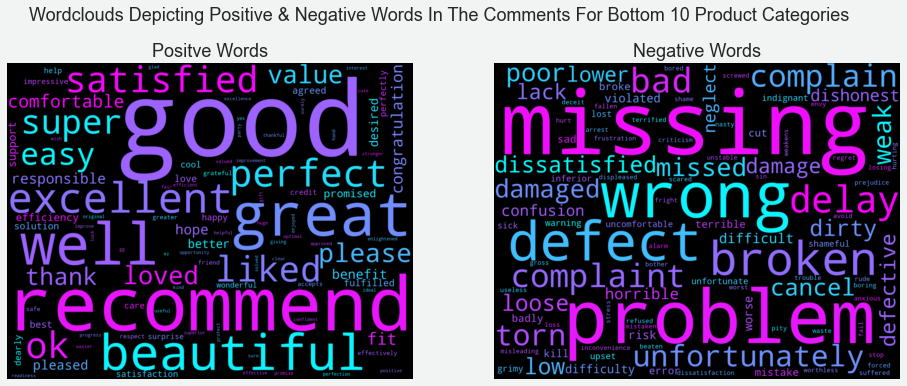

In [27]:
# initialize VADER
sid = SentimentIntensityAnalyzer()
bottom10_pos_words=[]
bottom10_neu_words=[]
bottom10_neg_words=[]
for word in words_bottom10:
    if (sid.polarity_scores(word)['compound']) >= 0.25:
        bottom10_pos_words.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.25:
        bottom10_neg_words.append(word)
    else:
        bottom10_neu_words.append(word)    

bottom10_pos = " ".join ([w for w in bottom10_pos_words])
bottom10_neg = " ".join ([w for w in bottom10_neg_words])

bottom10_comment_df = pd.DataFrame({'Categories': {0: 'Positive', 1: 'Negative'}, 
                          'Words': {0: bottom10_pos, 1: bottom10_neg}})

fig, ax = plt.subplots(figsize=(16,12), facecolor='#F2F4F4')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.2, hspace=0.2)
count=1
for i in range(2):
    wc = WordCloud(background_color='black', width=1800, height=1400,colormap='cool', collocations = False).generate(text=bottom10_comment_df["Words"][i])   
    plt.subplot(1, 2, count)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    if i==0:
        plt.title("Positve Words", fontsize=18)
    else:
        plt.title("Negative Words", fontsize=18)
    count+=1
    i+=1    
    
fig.suptitle(('wordclouds depicting positive & negative words in the comments for bottom 10 product categories').title(), 
             x=0.5, y=0.75, fontsize=18);

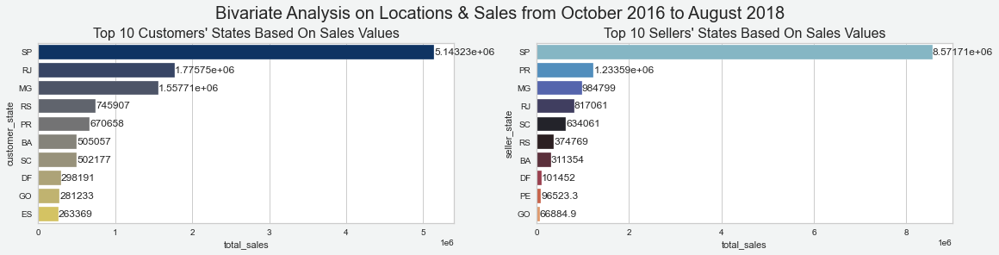

In [28]:
fig, ax = plt.subplots(1,2,figsize=(16,4), facecolor='#F2F4F4',constrained_layout=True)

top10_customer_state = comp_df.groupby('customer_state').agg({'price':'sum'}).sort_values(by='price',ascending=False).head(10).reset_index()
top10_customer_state.rename(columns={'price':'total_sales'},inplace=True)
b = sns.barplot(y=top10_customer_state['customer_state'], x=top10_customer_state['total_sales'],palette='cividis',ax=ax[0])
b.bar_label(b.containers[0], fontsize=12)
b.set_title(("top 10 customers' states based on sales values").title(), fontsize=16);

top10_seller_state = comp_df.groupby('seller_state').agg({'price':'sum'}).sort_values(by='price',ascending=False).head(10).reset_index()
top10_seller_state.rename(columns={'price':'total_sales'},inplace=True)
c = sns.barplot(y=top10_seller_state['seller_state'], x=top10_seller_state['total_sales'], palette='icefire',ax=ax[1])
c.bar_label(c.containers[0], fontsize=12)
c.set_title(("top 10 sellers' states based on sales values").title(), fontsize=16);

plt.suptitle('Bivariate Analysis on Locations & Sales from October 2016 to August 2018',fontsize=20);

In [29]:
comp_df['source_destination']=comp_df['customer_state']+'-'+comp_df['seller_state']
freq20_source_dest = comp_df.groupby(['source_destination']).agg({'source_destination':'count','freight_value':'median'}).rename(columns={'source_destination':'count'}).sort_values('count',ascending=False).head(20).reset_index()
top20_sd = freq20_source_dest['source_destination'].to_list()
top20_source_destination = comp_df[comp_df['source_destination'].isin(top20_sd)]

m = px.box(x=top20_source_destination['source_destination'], 
           y=np.log(top20_source_destination['freight_value']),
           color_discrete_sequence=['green'])
m.update_layout(title="Frequent Locations (From Source State to Destination State) vs Freight",
                xaxis_title="Source_Destination",
                yaxis_title="Freight")
m.show()

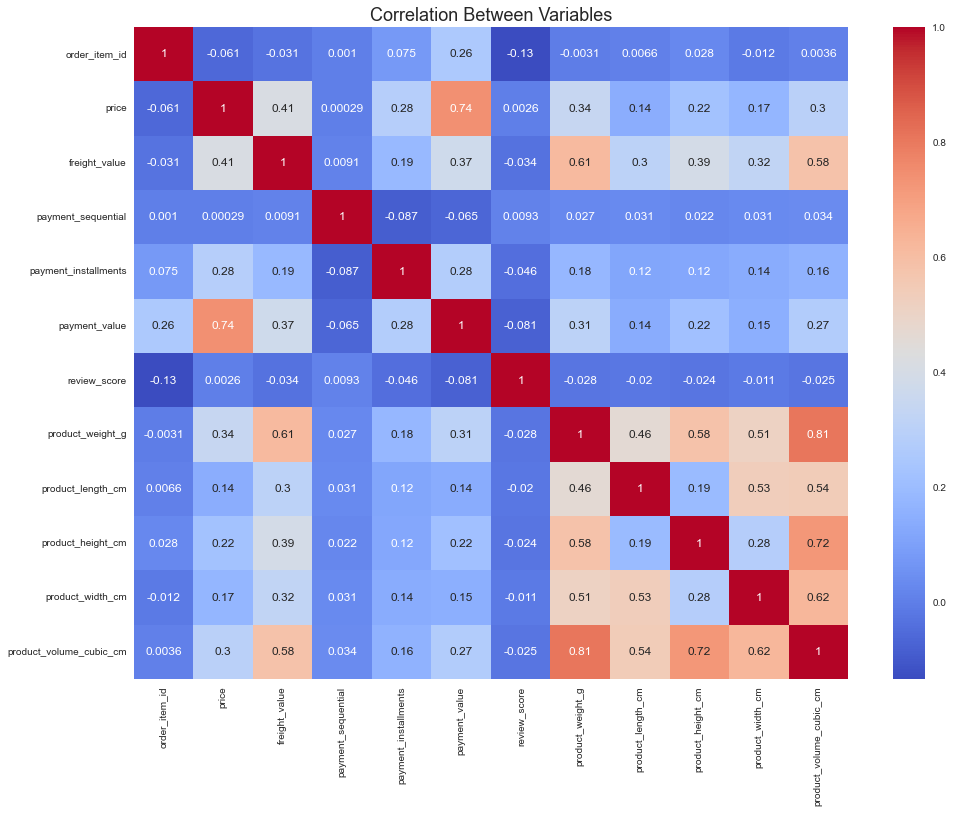

In [30]:
plt.figure(figsize=(16,12))
sns.heatmap(comp_df.corr(),annot=True,fmt='.2g',cmap='coolwarm')
plt.title('Correlation Between Variables',fontsize=18);

# Using K-means Clustering to Create Customer Segments

We would first identify recency, frequency & monetary features of the customers to assign a value to the customer. A high value customer is one who buys frequently, just bought something recently, and spends a high amount whenever he/ she buys or shops. <br><br>
After that, we will be using the **K-means clustering algorithm**, to perform customer segmentation. This algorithm requires mean centering of the variable values. To ensure that the algorithm perform well and all the variables are in the same range, we will scale the values of the variables, so that the variables has a mean of 1 and variance of 0.<br><br>

To take care of the huge range of values for the monetary variable, we will transform all the variables on the log scale. This transformation, along with the standardization, will ensure that the input to our algorithm is a homogenous set of scaled and transformed values.

In [31]:
print('Earlist Purchase Date: ', comp_df['order_purchase_timestamp'].min())
print('Latest Purchase Date: ', comp_df['order_purchase_timestamp'].max())

Earlist Purchase Date:  2016-10-03 09:44:50
Latest Purchase Date:  2018-08-29 15:00:37


In [32]:
reference_date = comp_df['order_purchase_timestamp'].max()
reference_date = reference_date + datetime.timedelta(days = 1)

In [33]:
# Create recency variable as the number of days before the reference date when a customer last made a purchase.
comp_df['days_since_last_purchase'] = reference_date - comp_df['order_purchase_timestamp']
comp_df['days_since_last_purchase_num'] = comp_df['days_since_last_purchase'].astype('timedelta64[D]')

In [34]:
customer_history_df = comp_df.groupby("customer_id").min().reset_index()[['customer_id', 'days_since_last_purchase_num']]
customer_history_df.rename(columns={'days_since_last_purchase_num':'recency'}, inplace=True)

customer_monetary_val = comp_df[['customer_id', 'price']].groupby("customer_id").agg({'price':'sum'}).reset_index()
customer_monetary_val.rename(columns={'price':'monetary'},inplace=True)
customer_history_df = customer_history_df.merge(customer_monetary_val, how='outer')
customer_history_df['monetary'] = customer_history_df['monetary']+0.001
# added a small figure 0.001 to the customer monetary value
# Otheriwise, transform values to the log scale and presence of zeroes in the data may lead to an error.

customer_freq = comp_df[['customer_id', 'price']].groupby("customer_id").count().reset_index()
customer_freq.rename(columns={'price':'frequency'},inplace=True)
customer_history_df = customer_history_df.merge(customer_freq, how='outer')

customer_history_df.describe()

,recency,monetary,frequency
count,93164.000000,93164.000000,93164.000000
mean,238.345198,143.386358,1.190213
std,152.822091,236.445750,0.727346
min,1.000000,0.851000,1.000000
25%,114.000000,47.491000,1.000000
50%,219.000000,89.001000,1.000000
75%,348.000000,153.901000,1.000000
max,696.000000,13440.001000,63.000000


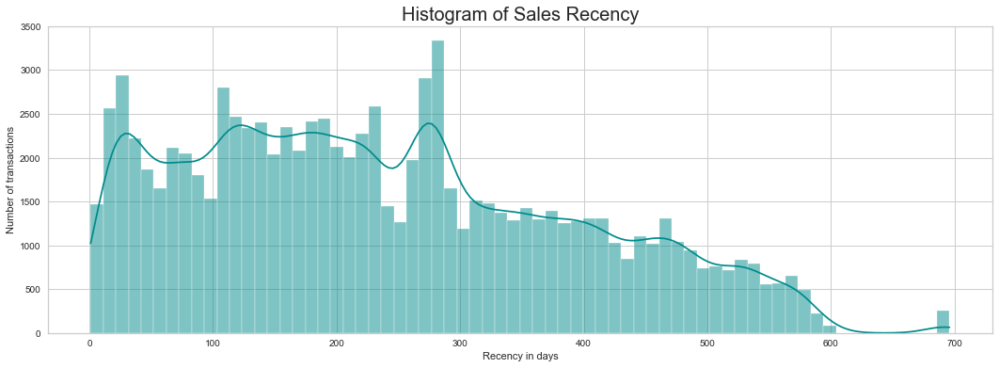

In [35]:
plt.figure(figsize=(18,6))
sns.histplot(customer_history_df['recency'],kde=True,color='darkcyan')
plt.xlabel('Recency in days')
plt.ylabel('Number of transactions')
plt.title('Histogram of Sales Recency',fontsize=20);

In [36]:
customer_history_df['recency_log'] = customer_history_df['recency'].apply(math.log)
customer_history_df['frequency_log'] = customer_history_df['frequency'].apply(math.log)
customer_history_df['monetary_log'] = customer_history_df['monetary'].apply(math.log)

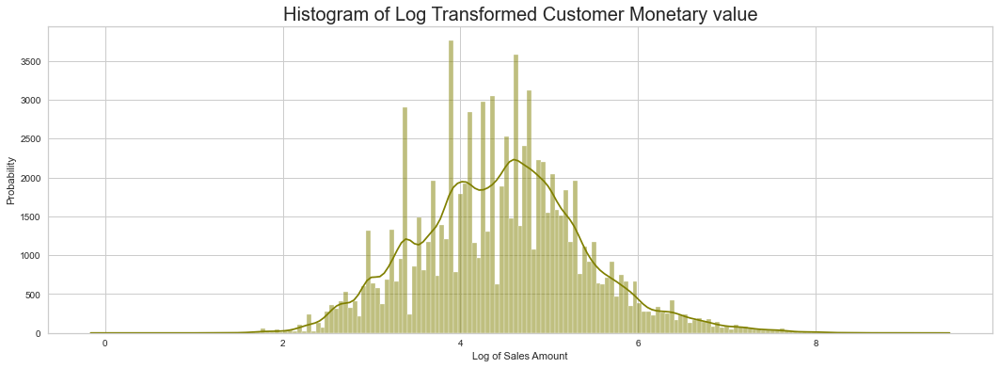

In [37]:
plt.figure(figsize=(18,6))
sns.histplot(customer_history_df['monetary_log'], kde=True,color='olive')
plt.xlabel('Log of Sales Amount')
plt.ylabel('Probability')
plt.title('Histogram of Log Transformed Customer Monetary value',fontsize=20);

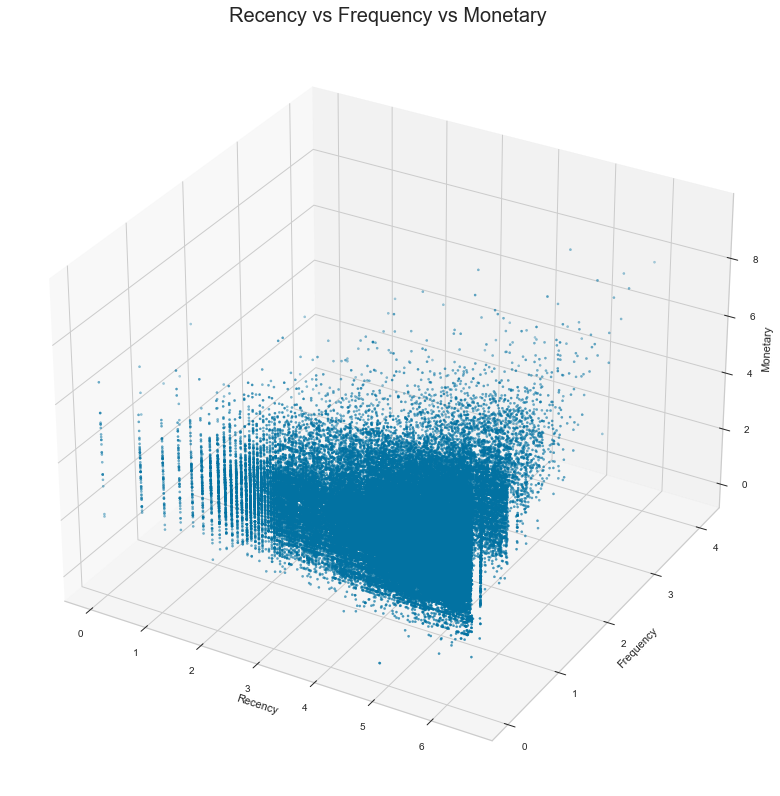

In [38]:
# option 1
# n = px.scatter_3d(customer_history_df, x='recency_log', y='frequency_log', z='monetary_log',color_discrete_sequence=['orange'])
# n.show()

# option 2
fig = plt.figure(figsize=(16, 14))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(customer_history_df['recency_log'], customer_history_df['frequency_log'], customer_history_df['monetary_log'],s=5)
ax.set_xlabel('Recency')
ax.set_ylabel('Frequency')
ax.set_zlabel('Monetary')
ax.set_title('Recency vs Frequency vs Monetary',fontsize=20);

# option 3
# plt.figure(figsize=(16,6))
# sns.heatmap(customer_history_df[['recency_log','frequency_log','monetary_log']].corr(),annot=True,fmt='.2g',cmap='gist_earth_r')
# plt.title("Correlation Between Variables Related to Customers' Values",fontsize=18);

In [39]:
feature_vector = ['monetary_log', 'recency_log','frequency_log']
X_subset = customer_history_df[feature_vector]
scaler = preprocessing.StandardScaler().fit(X_subset)
X_scaled = scaler.transform(X_subset)

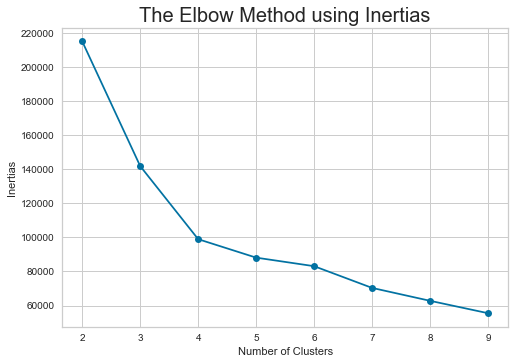

In [40]:
distortions = []
inertias = []
mapping1 = {}
mapping2 = {}

K = range(2,10)
for k in K:
    # Building and fitting the model
    kmeanModel = MiniBatchKMeans(n_clusters=k)
    kmeanModel.fit(X_scaled)
    distortions.append(sum(np.min(cdist(X_scaled, kmeanModel.cluster_centers_,'euclidean'), axis=1)) / X_scaled.shape[0])
    inertias.append(kmeanModel.inertia_)
    mapping1[k] = sum(np.min(cdist(X_scaled, kmeanModel.cluster_centers_,'euclidean'), axis=1)) / X_scaled.shape[0]
    mapping2[k] = kmeanModel.inertia_
    
plt.plot(K, inertias, 'bo-')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertias')
plt.title('The Elbow Method using Inertias',fontsize=20);

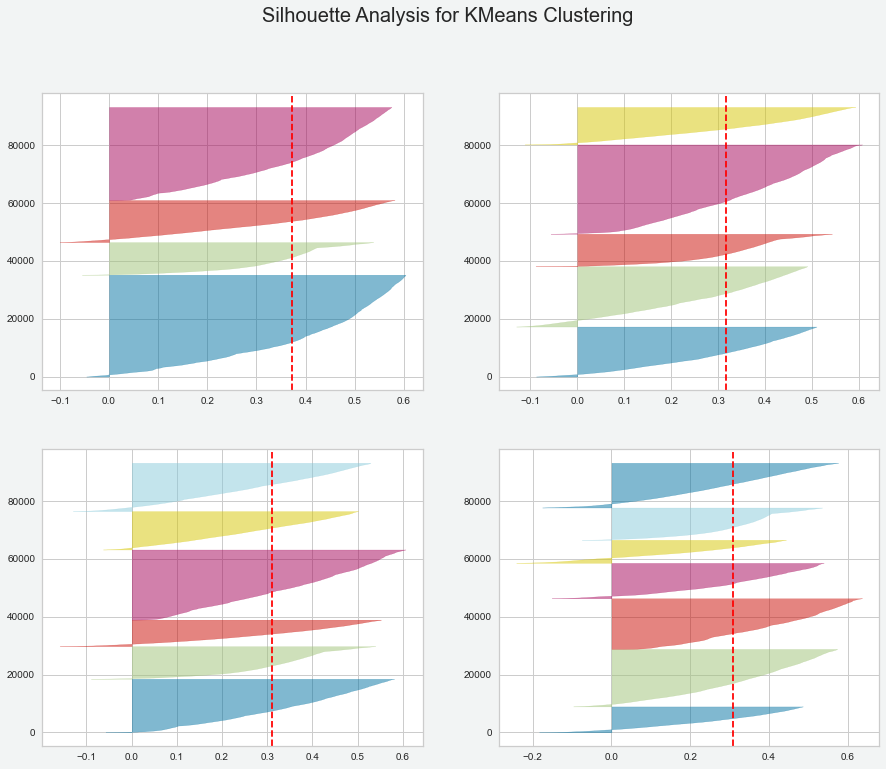

In [41]:
fig, ax = plt.subplots(figsize=(15,12), facecolor='#F2F4F4')
count=1
for i in range(4,8):
    plt.subplot(2,2,count)
    # Create MiniBatchKMeans instance for different number of clusters
    km = MiniBatchKMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, batch_size=100, random_state=42)
    # Fit the SilhouetteVisualizer instance with KMeans instance
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick')
    visualizer.fit(X_scaled)
    count+=1        
plt.suptitle('Silhouette Analysis for KMeans Clustering', fontsize=20);

To speed up K-Means Clustering with only a small cost in quality, we used **Mini-batch k-means**, whereby the most computationally costly step is conducted on only a random sample of observations as opposed to all observations. The batch_size in Mini-batch k-means controls the number of randomly selected observations in each batch. The larger the size of the batch, the more computationally costly the training process.<br><br>
To determine the optimal number of clusters, we have to select the value of k after which the inertia start decreasing in a linear fashion. In this case, **the value of k would be 5**. And, it is supported by the result of Silhouette analysis because **the silhouette score for each cluster is above average silhouette scores** and **the thickness of the silhouette plot is almost similar**. 

In [42]:
#Initialize the class object
kmeans = MiniBatchKMeans(n_clusters= 5, init='k-means++', n_init=10, max_iter=100, batch_size=10, random_state=42)
 
#predict the labels of clusters.
km_labels = kmeans.fit_predict(X_scaled)

# Assign Cluster Labels 
customer_history_df['clusters_labels'] = km_labels

# sns.scatterplot(x='recency_log', y='monetary_log', hue='clusters_labels', 
#                 data=customer_history_df.loc[0:100], palette='coolwarm');

In [43]:
def plot_clusters(field_to_plot):
    py.offline.init_notebook_mode()
    x_data = ['Cluster 1','Cluster 2','Cluster 3','Cluster 4','Cluster 5']
    cutoff_quantile = 90
    y0 = customer_history_df[customer_history_df['clusters_labels']==0][field_to_plot].values
    y0 = y0[y0<np.percentile(y0, cutoff_quantile)]
    y1 = customer_history_df[customer_history_df['clusters_labels']==1][field_to_plot].values
    y1 = y1[y1<np.percentile(y1, cutoff_quantile)]
    y2 = customer_history_df[customer_history_df['clusters_labels']==2][field_to_plot].values
    y2 = y2[y2<np.percentile(y2, cutoff_quantile)]
    y3 = customer_history_df[customer_history_df['clusters_labels']==3][field_to_plot].values
    y3 = y3[y3<np.percentile(y3, cutoff_quantile)]
    y4 = customer_history_df[customer_history_df['clusters_labels']==4][field_to_plot].values
    y4 = y4[y4<np.percentile(y4, cutoff_quantile)]
    y_data = [y0,y1,y2,y3,y4]

    colors = ['rgba(93, 164, 214, 0.5)', 'rgba(255, 144, 14, 0.5)', 'rgba(44, 160, 101, 0.5)', 
              'rgba(255, 65, 54, 0.5)','rgba(207, 114, 255, 0.5)']
    traces = []


    for xd, yd, cls in zip(x_data, y_data, colors):
            traces.append(go.Box(
                y=yd,
                name=xd,
                boxpoints=False,
                jitter=0.5,
                whiskerwidth=0.2,
                fillcolor=cls,
                marker=dict(
                    size=2,
                ),
                line=dict(width=1),
            ))

    layout = go.Layout(
        title='Difference in {} from cluster to cluster'.format(field_to_plot),
        yaxis=dict(
            autorange=True,
            showgrid=True,
            zeroline=True,
            dtick=1000,
            gridcolor='black',
            gridwidth=0.1,
            zerolinecolor='rgb(255, 255, 255)',
            zerolinewidth=2,
        ),
        margin=dict(
            l=40,
            r=30,
            b=80,
            t=100,
        ),
        paper_bgcolor='white',
        plot_bgcolor='white',
        showlegend=False
    )

    fig = go.Figure(data=traces, layout=layout)
    py.offline.iplot(fig)

In [44]:
plot_clusters('monetary')

We can see that the Clusters 4 has a higher average sales amount, thus being the highest spenders. In constrast, we do see a markedly smaller sales amount in Cluster 2. There is no much difference in the sales values of Clusters 1 and 5 and this gives us an indication that we can merge the candidates of these 2 clusters together, at least on the basis of sales amount.

# Summary & Recommendations
1. More than 50% of the items is rated as 5. Based on the wordclouds that display the negative words, the reasons that led to low review scores could be low quality (wrong/ torn/ broken/ dirty/ missing) items, delayed delivery, and others.
2. Based on the visualization that displays the frequent locations (from the source city to destination city), the range for median of the freight values is between 2.32 and 3.29. From the heatmap plotted, the freight value is positively correlated with product weight and product volume.
3. Other unsupervised learing algorithm such as DBCAN or hierarchical clustering ould be used to perform customer segmentation. 